In [1]:
#import urllib2
from io import StringIO
import os
import xmltodict
import pandas as pd
import geopandas as gpd
import windrose

from datetime import datetime 
import statsmodels.api as sm

from scipy.stats import linregress
import matplotlib.pyplot as plt
import numpy as np
import sys
import requests
import glob

from pyproj import CRS
from pyproj import Transformer
from shapely.geometry import Point

import rasterio

from rasterio.plot import show
from rasterio.mask import mask
from rasterio.plot import show_hist
from shapely.geometry import box
from windrose import WindroseAxes
#import pycrs
#import earthpy as et
#import earthpy.plot as ep

from scipy.optimize import curve_fit

from sklearn import mixture
import itertools
from scipy import linalg
import matplotlib as mpl

import pathlib

import plotly.express as px


#import pymannkendall as mk
from pylab import rcParams
%matplotlib inline
rcParams['figure.figsize'] = 15, 10

# Import Files

In [2]:
comp_dir = pathlib.Path("G:/Shared drives/UGS_Groundwater/Projects/Eddy_Covariance/Data_Processing/Wellington/comparison_files")
openet_xl_file = comp_dir / "explore.etdata.org_raster_latlon_(0,0) (2).xlsx"
xl_comp = comp_dir / "LI710_Wellington_working.xlsx"

rs_path = pathlib.Path("G:/Shared drives/UGS_Groundwater/Projects/Eddy_Covariance/Data_Processing/Jupyter_Notebooks/Cottonwood")
gridmet_dfs = pd.read_feather(rs_path/"gridmet_weather_station_data.feather")
nlads_dfs = pd.read_feather(rs_path/"nlads_weather_station_data.feather")

cs_data = comp_dir / "Wellington_Flux_AmeriFluxFormat (3).dat"

# Define Custom Functions

In [4]:
def scatterColor(x0,y,w):
    """Creates scatter plot with points colored by variable.
    All input arrays must have matching lengths

    Arg:
        x0 (array): 
            array of x values
        y (array): 
            array of y values
        w (array): 
            array of scalar values

    Returns:
        slope and intercept of best fit line
    
    """
    import matplotlib as mpl
    import matplotlib.cm as cm
    cmap = plt.cm.get_cmap('RdYlBu')
    norm = mpl.colors.Normalize(vmin=w.min(), vmax=w.max())
    m = cm.ScalarMappable(norm=norm, cmap=cmap)
    m.set_array(w)
    sc = plt.scatter(x0, y, label='', color = m.to_rgba(w))

    xa = sm.add_constant(x0)

    est = sm.RLM(y, xa).fit()
    r2 = sm.WLS(y, xa, weights=est.weights).fit().rsquared
    slope = est.params[1]

    x_prime = np.linspace(np.min(x0),np.max(x0),100)[:, np.newaxis]
    x_prime = sm.add_constant(x_prime)
    y_hat = est.predict(x_prime)

    const = est.params[0]
    y2 = [i*slope + const for i in x0]


    lin = linregress(x0,y)
    x1 = np.arange(np.min(x0), np.max(x0),0.1)
    y1 = [i*lin[0]+lin[1] for i in x1]
    y2 = [i*slope+const for i in x1]
    plt.plot(x1,y1,c='g',label='simple linear regression m = {:.2f} b = {:.0f}, r² = {:.2f}'.format(lin[0],lin[1],lin[2]**2))
    plt.plot(x1,y2,c='r',label='rlm regression m = {:.2f} b = {:.0f}, r² = {:.2f}'.format(slope,const,r2))
    #plt.legend()
    cbar = plt.colorbar(m)

    cbar.set_label('Day of Year')

    return slope,const,r2


# Compare LI-710

## Compare ET

C:\Users\paulinkenbrandt\AppData\Local\Temp\1\ipykernel_3068\2036220280.py:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('RdYlBu')


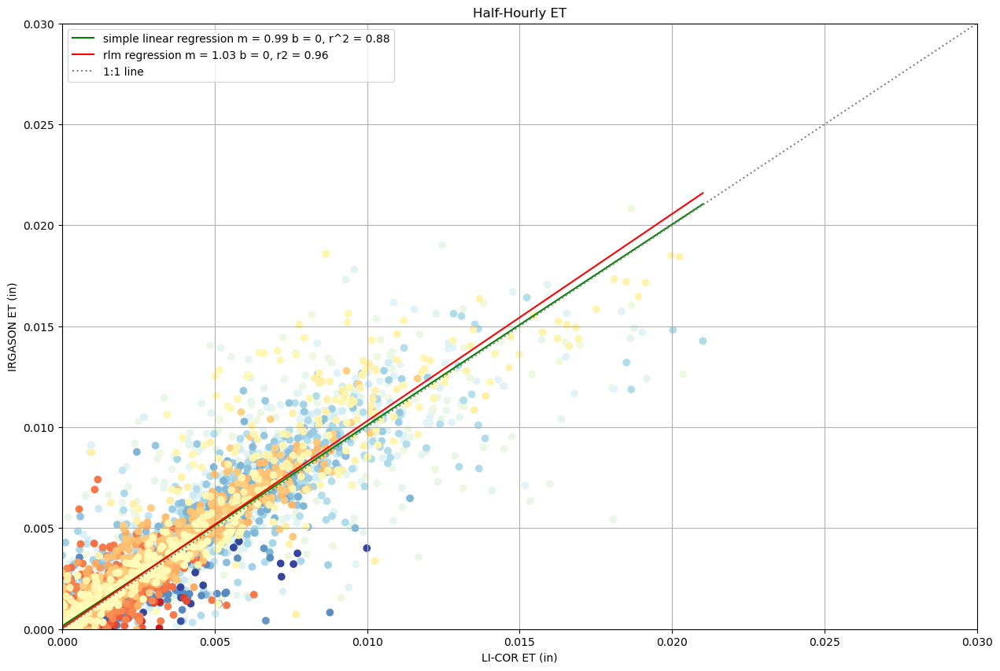

In [15]:
xl_compare = pd.read_excel(xl_comp, "ET")

xl_compare.index = pd.date_range(start='2022-07-21 00:00:00', end='2023-07-16 01:30', freq='30min')

xl_points = xl_compare[['LI-COR ET (in)','CSI ET (in)']].dropna()

x0 = xl_points['LI-COR ET (in)']
y = xl_points['CSI ET (in)']
w = xl_points.index.dayofyear


import matplotlib as mpl
import matplotlib.cm as cm





cmap = plt.cm.get_cmap('RdYlBu')
norm = mpl.colors.Normalize(vmin=w.min(), vmax=w.max())
m = cm.ScalarMappable(norm=norm, cmap=cmap)
m.set_array(w)
sc = plt.scatter(x0, y, label='', color = m.to_rgba(w))

xa = sm.add_constant(x0)

est = sm.RLM(y, xa).fit()
r2 = sm.WLS(y, xa, weights=est.weights).fit().rsquared
slope = est.params[1]

x_prime = np.linspace(np.min(x0),np.max(x0),100)[:, np.newaxis]
x_prime = sm.add_constant(x_prime)
y_hat = est.predict(x_prime)

const = est.params[0]
y2 = [i*slope + const for i in x0]


lin = linregress(x0,y)
x1 = np.linspace(np.min(x0), np.max(x0),100)
y1 = [i*lin[0]+lin[1] for i in x1]
y2 = [i*slope+const for i in x1]
plt.plot(x1,y1,c='g',label='simple linear regression m = {:.2f} b = {:.0f}, r^2 = {:.2f}'.format(lin[0],lin[1],lin[2]**2))
plt.plot(x1,y2,c='r',label='rlm regression m = {:.2f} b = {:.0f}, r2 = {:.2f}'.format(slope,const,r2))
#plt.legend()

#scatterColor(x0,y,w)
plt.grid()

plt.plot(np.linspace(0,.5,10),np.linspace(0,.5,10),linestyle=':',color='grey',label="1:1 line")
plt.xlabel('LI-COR ET (in)')
plt.ylabel('IRGASON ET (in)')
plt.xlim(0,.03)
plt.ylim(0,.03)
plt.legend()

cbar = plt.colorbar(m)
plt.title("Half-Hourly ET")
plt.savefig("G:/Shared drives/UGS_Groundwater/Projects/Eddy_Covariance/Writing Outreach and Presentations/figures/half_hourly_et.jpg")
plt.savefig("G:/Shared drives/UGS_Groundwater/Projects/Eddy_Covariance/Writing Outreach and Presentations/figures/half_hourly_et.pdf")

Daily Aggregations

C:\Users\paulinkenbrandt\AppData\Local\Temp\1\ipykernel_3068\2172475565.py:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('RdYlBu')
C:\Users\paulinkenbrandt\AppData\Local\Temp\1\ipykernel_3068\2172475565.py:54: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(m)


Text(0.5, 1.0, 'Daily ET')

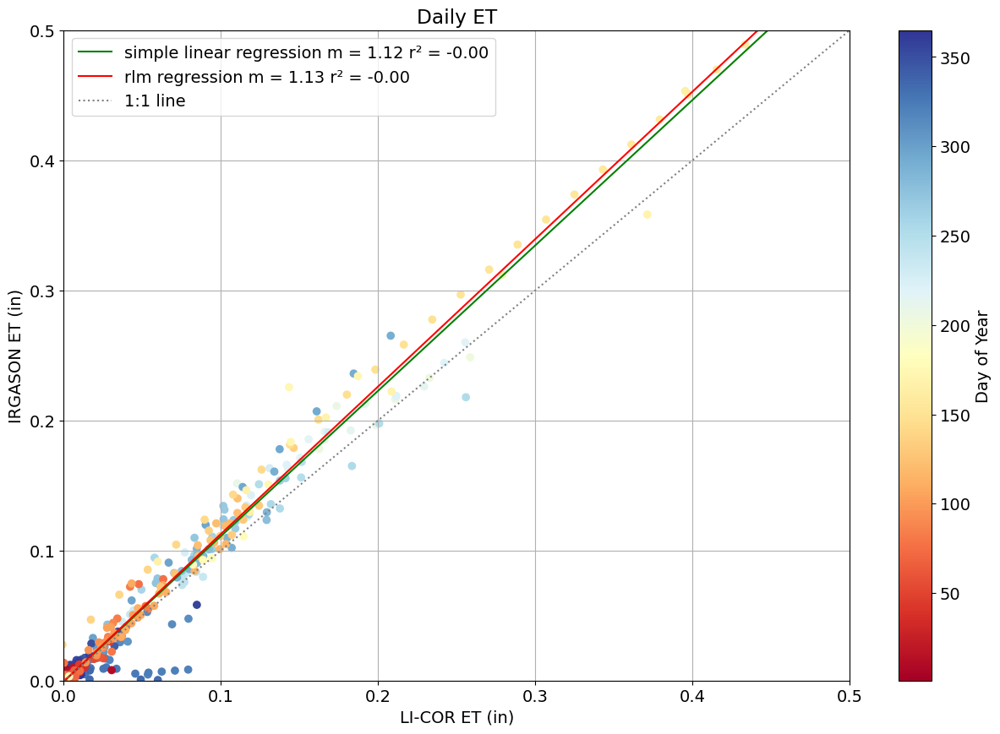

In [28]:
xl_compare = pd.read_excel(xl_comp, "ET")

xl_compare.index = pd.date_range(start='2022-07-21 00:00:00', end='2023-07-16 01:30', freq='30min')

xl_points = xl_compare[['LI-COR ET (in)','CSI ET (in)']].dropna().resample('30min').asfreq().interpolate().resample('1D').sum()

x0 = xl_points['LI-COR ET (in)']
y = xl_points['CSI ET (in)']
w = xl_points.index.dayofyear


import matplotlib as mpl
import matplotlib.cm as cm


mpl.rcParams.update({'font.size': 14})


cmap = plt.cm.get_cmap('RdYlBu')
norm = mpl.colors.Normalize(vmin=w.min(), vmax=w.max())
m = cm.ScalarMappable(norm=norm, cmap=cmap)
m.set_array(w)
sc = plt.scatter(x0, y, label='', color = m.to_rgba(w))

xa = sm.add_constant(x0)

est = sm.RLM(y, xa).fit()
r2 = sm.WLS(y, xa, weights=est.weights).fit().rsquared
slope = est.params[1]

x_prime = np.linspace(np.min(x0),np.max(x0),100)[:, np.newaxis]
x_prime = sm.add_constant(x_prime)
y_hat = est.predict(x_prime)

const = est.params[0]
y2 = [i*slope + const for i in x0]


lin = linregress(x0,y)
x1 = np.linspace(np.min(x0), np.max(x0),100)
y1 = [i*lin[0]+lin[1] for i in x1]
y2 = [i*slope+const for i in x1]
plt.plot(x1,y1,c='g',label='simple linear regression m = {:.2f} r² = {:.2f}'.format(lin[0],lin[1],lin[2]**2))
plt.plot(x1,y2,c='r',label='rlm regression m = {:.2f} r² = {:.2f}'.format(slope,const,r2))
#plt.legend()

#scatterColor(x0,y,w)
plt.grid()

plt.plot(np.linspace(0,0.5,10),np.linspace(0,0.5,10),linestyle=':',color='grey',label="1:1 line")
plt.xlabel('LI-COR ET (in)')
plt.ylabel('IRGASON ET (in)')

cbar = plt.colorbar(m)

cbar.set_label('Day of Year')

plt.xlim(0,0.5)
plt.ylim(0,0.5)
plt.legend()
plt.title("Daily ET")

## Compare H

C:\Users\paulinkenbrandt\AppData\Local\Temp\1\ipykernel_3068\2340871999.py:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('RdYlBu')
C:\Users\paulinkenbrandt\AppData\Local\Temp\1\ipykernel_3068\2340871999.py:54: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(m)


Text(0.5, 1.0, 'Half-Hourly H')

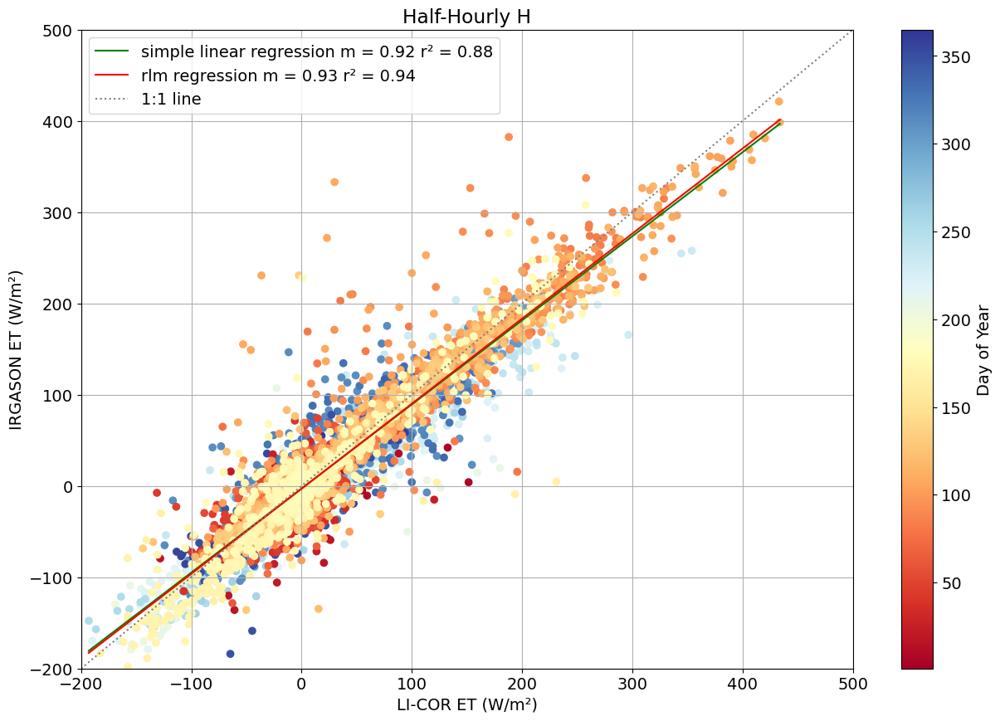

In [35]:
xl_compare = pd.read_excel(xl_comp, "H")

xl_compare.index = pd.date_range(start='2022-07-21 00:00:00', end='2023-07-15 23:30', freq='30min')

xl_points = xl_compare[['IRGASON','LI-710']].dropna()#.resample('30min').asfreq().interpolate().resample('1D').mean()

x0 = xl_points['LI-710']
y = xl_points['IRGASON']
w = xl_points.index.dayofyear


import matplotlib as mpl
import matplotlib.cm as cm


mpl.rcParams.update({'font.size': 14})


cmap = plt.cm.get_cmap('RdYlBu')
norm = mpl.colors.Normalize(vmin=w.min(), vmax=w.max())
m = cm.ScalarMappable(norm=norm, cmap=cmap)
m.set_array(w)
sc = plt.scatter(x0, y, label='', color = m.to_rgba(w))

xa = sm.add_constant(x0)

est = sm.RLM(y, xa).fit()
r2 = sm.WLS(y, xa, weights=est.weights).fit().rsquared
slope = est.params[1]

x_prime = np.linspace(np.min(x0),np.max(x0),100)[:, np.newaxis]
x_prime = sm.add_constant(x_prime)
y_hat = est.predict(x_prime)

const = est.params[0]
y2 = [i*slope + const for i in x0]


lin = linregress(x0,y)
x1 = np.linspace(np.min(x0), np.max(x0),100)
y1 = [i*lin[0]+lin[1] for i in x1]
y2 = [i*slope+const for i in x1]
plt.plot(x1,y1,c='g',label='simple linear regression m = {:.2f} r² = {:.2f}'.format(lin[0],lin[2]**2))
plt.plot(x1,y2,c='r',label='rlm regression m = {:.2f} r² = {:.2f}'.format(slope,r2))
#plt.legend()

#scatterColor(x0,y,w)
plt.grid()

plt.plot(np.linspace(-200,500,10),np.linspace(-200,500,10),linestyle=':',color='grey',label="1:1 line")
plt.xlabel('LI-COR ET (W/m²)')
plt.ylabel('IRGASON ET (W/m²)')

cbar = plt.colorbar(m)

cbar.set_label('Day of Year')

plt.xlim(-200,500)
plt.ylim(-200,500)
plt.legend()
plt.title("Half-Hourly H")

# Compare Measured ET to OpenET

In [93]:
cs_dat = pd.read_csv(cs_data,skiprows=[0,2,3],low_memory=False, na_values=['NAN'])
cs_dat['TIMESTAMP'] = pd.to_datetime(cs_dat['TIMESTAMP'])
cs_dat = cs_dat.set_index('TIMESTAMP')
for col in cs_dat:
    cs_dat[col] = pd.to_numeric(cs_dat[col])

In [73]:
well_gridmet = gridmet_dfs.set_index(['stationid','Timestamp']).loc[1682]
well_nlads = nlads_dfs.set_index(['stationid','Timestamp']).loc[1682]

In [126]:
cs_dat.columns

Index(['RECORD', 'TIMESTAMP_START', 'TIMESTAMP_END', 'CO2', 'CO2_SIGMA', 'H2O',
       'H2O_SIGMA', 'FC', 'FC_SSITC_TEST', 'LE', 'LE_SSITC_TEST', 'ET',
       'ET_SSITC_TEST', 'H', 'H_SSITC_TEST', 'G', 'SG', 'FETCH_MAX',
       'FETCH_90', 'FETCH_55', 'FETCH_40', 'WD', 'WS', 'WS_MAX', 'USTAR', 'ZL',
       'TAU', 'TAU_SSITC_TEST', 'MO_LENGTH', 'U', 'U_SIGMA', 'V', 'V_SIGMA',
       'W', 'W_SIGMA', 'PA', 'TA_1_1_1', 'RH_1_1_1', 'T_DP_1_1_1', 'TA_2_1_1',
       'RH_2_1_1', 'T_DP_2_1_1', 'TA_3_1_1', 'RH_3_1_1', 'T_DP_3_1_1', 'VPD',
       'T_SONIC', 'T_SONIC_SIGMA', 'PBLH', 'TS_1_1_1', 'TS_2_1_1', 'SWC_1_1_1',
       'SWC_2_1_1', 'ALB', 'NETRAD', 'SW_IN', 'SW_OUT', 'LW_IN', 'LW_OUT', 'P',
       'TA_1_2_1', 'RH_1_2_1', 'TA_1_3_1', 'SWC_3_1_1', 'SWC_4_1_1', 'K_3_1_1',
       'TS_3_1_1', 'EC_3_1_1', 'SWC_3_2_1', 'K_3_2_1', 'TS_3_2_1', 'EC_3_2_1',
       'SWC_3_3_1', 'K_3_3_1', 'TS_3_3_1', 'EC_3_3_1', 'SWC_3_4_1', 'K_3_4_1',
       'TS_3_4_1', 'EC_3_4_1', 'SWC_3_5_1', 'K_3_5_1', 'TS_3_5_1', 

(19178.0, 19270.0)

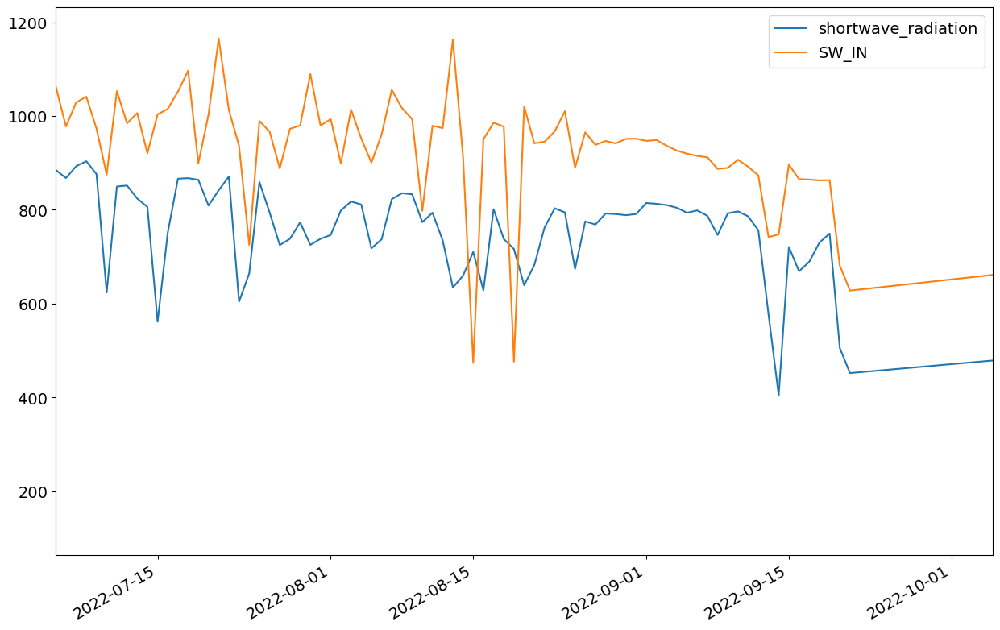

In [143]:
lw = pd.concat([well_nlads['longwave_radiation'],cs_dat['LW_IN'].shift(8)],axis=1)
lw = lw.dropna()
lw = lw[(lw['longwave_radiation']>10)&(lw['LW_IN']>10)]
lw = lw.resample('1D').max()
lw = lw.dropna()
x = lw['longwave_radiation']
y = lw['LW_IN']
w = lw.index.day_of_year
sw.plot()
plt.xlim('2022-07-05','2022-10-05')

C:\Users\paulinkenbrandt\AppData\Local\Temp\1\ipykernel_3068\1710666418.py:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('RdYlBu')
C:\Users\paulinkenbrandt\AppData\Local\Temp\1\ipykernel_3068\1710666418.py:46: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(m)


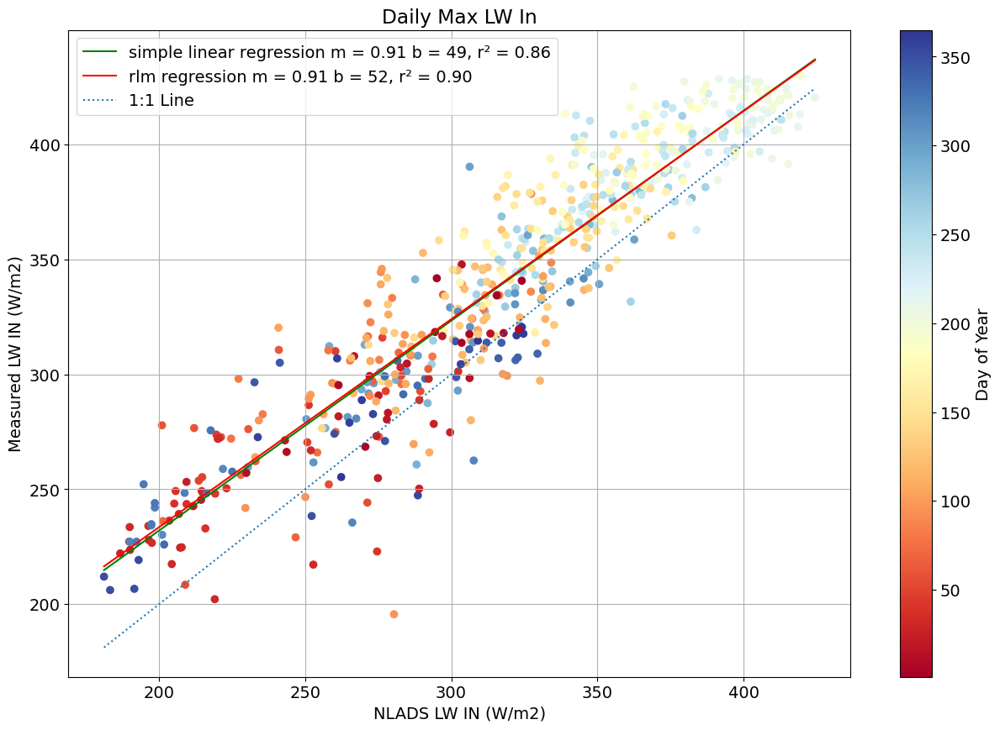

In [144]:
scatterColor(x,y,w)
plt.grid()
plt.plot(np.linspace(x.min(),x.max(),100),np.linspace(x.min(),x.max(),100),label='1:1 Line',linestyle=":")
plt.ylabel('Measured LW IN (W/m2)')
plt.xlabel('NLADS LW IN (W/m2)')
plt.title('Daily Max LW In')
plt.legend()

(19178.0, 19270.0)

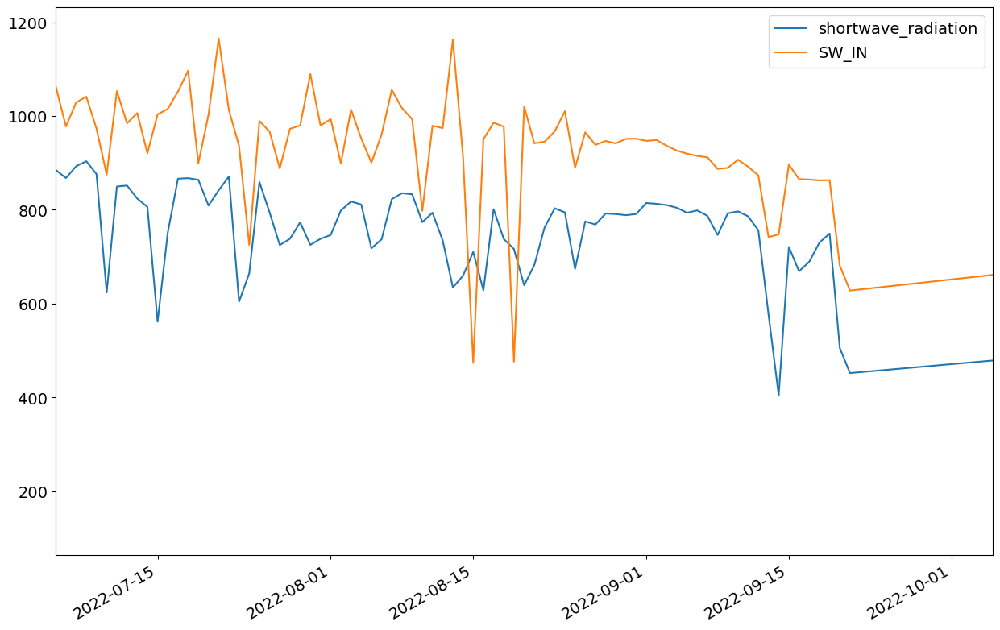

In [137]:
#well_nlads['shortwave_radiation'].plot()
#cs_dat['SW_IN'].plot()

sw = pd.concat([well_nlads['shortwave_radiation'],cs_dat['SW_IN'].shift(8)],axis=1)
sw = sw.dropna()
sw = sw[(sw['shortwave_radiation']>10)&(sw['SW_IN']>10)]
sw = sw.resample('1D').max()
sw = sw.dropna()
x = sw['shortwave_radiation']
y = sw['SW_IN']
w = sw.index.day_of_year
sw.plot()
plt.xlim('2022-07-05','2022-10-05')


C:\Users\paulinkenbrandt\AppData\Local\Temp\1\ipykernel_3068\1710666418.py:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('RdYlBu')
C:\Users\paulinkenbrandt\AppData\Local\Temp\1\ipykernel_3068\1710666418.py:46: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(m)


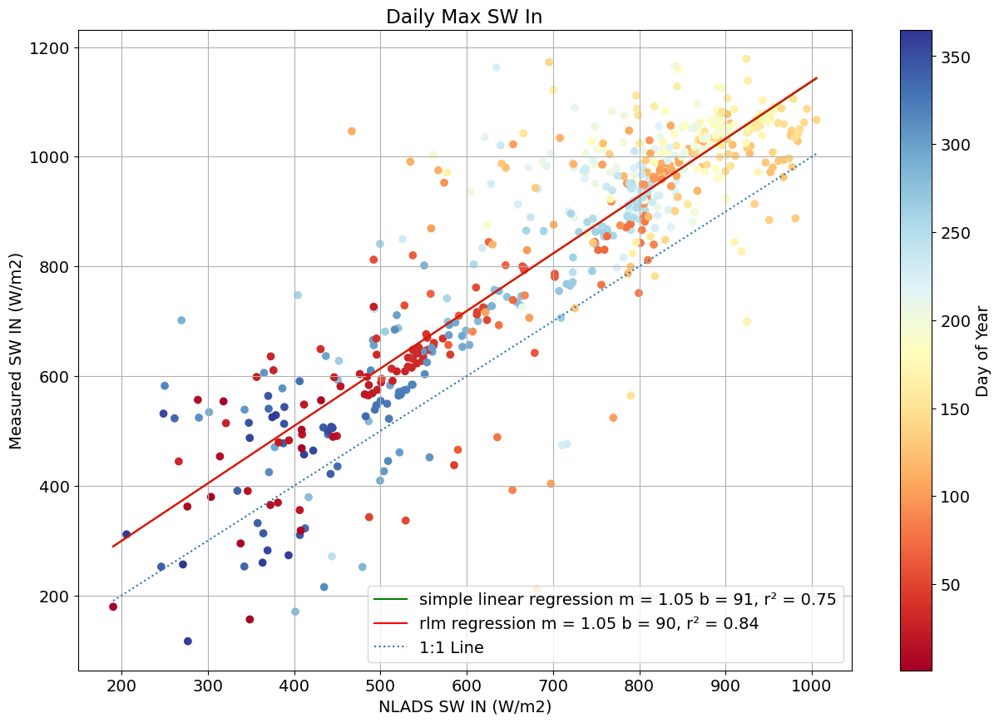

In [142]:
#plt.scatter(x,y)
scatterColor(x,y,w)
plt.grid()
plt.plot(np.linspace(x.min(),x.max(),100),np.linspace(x.min(),x.max(),100),label='1:1 Line',linestyle=":")
plt.ylabel('Measured SW IN (W/m2)')
plt.xlabel('NLADS SW IN (W/m2)')
plt.title('Daily Max SW In')
plt.legend()

In [77]:
pd.read_excel(xl_comp, "ET").columns

Index(['Datetime', 'LI-COR LE (W m-2)', 'ET Sensor (mm)', 'LI-COR ET (in)',
       'LI-COR ET cuml (mm)', 'LI-COR 24H ET (mm)', 'LI-COR 24H ET (in)',
       'CSI LE (W m-2)', 'CSI EC System (mm)', 'CSI ET (in)',
       'CSI ET cuml (mm)', 'CSI 24H ET (mm)', 'CSI 24H ET (in)',
       'CSI SWC_1_1_1 (%)'],
      dtype='object')

Text(0, 0.5, 'ET (in/day)')

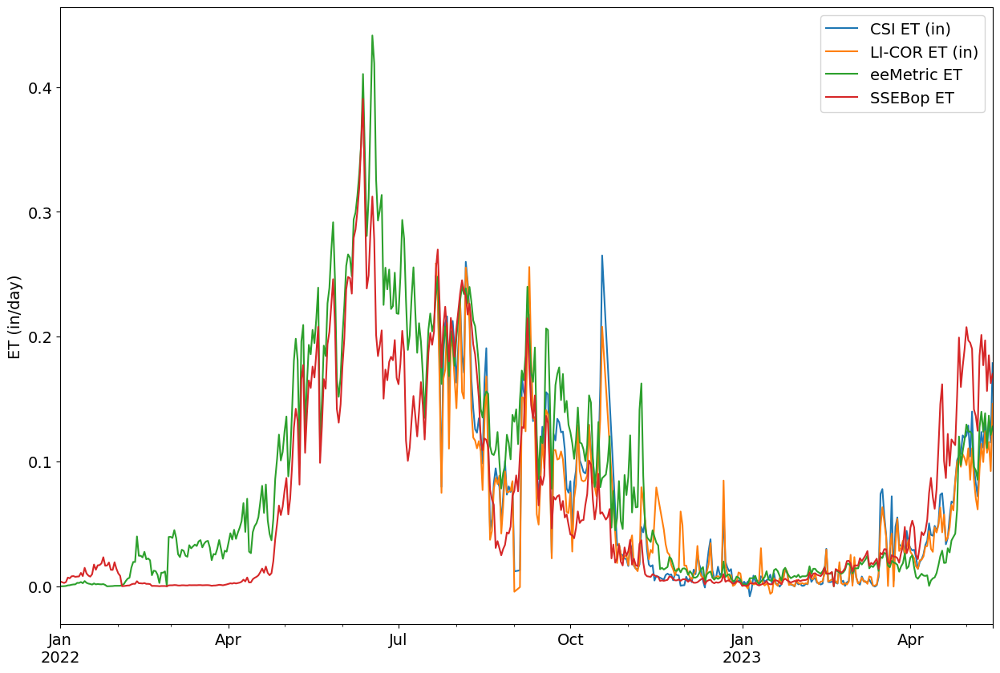

In [145]:
H_compare = pd.read_excel(xl_comp, "H")
H_compare.index = pd.date_range(start='2022-07-21 00:00:00', end='2023-07-15 23:30', freq='30min')
h_values = H_compare[['IRGASON','LI-710']].dropna().resample('30min').asfreq().interpolate().resample('1D').mean()

et_compare = pd.read_excel(xl_comp, "ET")
et_compare.index = pd.date_range(start='2022-07-21 00:00:00', end='2023-07-16 01:30', freq='30min')
et_values = et_compare[['LI-COR ET (in)','CSI ET (in)']].dropna().resample('30min').asfreq().interpolate().resample('1D').sum()

openet = pd.read_excel(openet_xl_file,parse_dates=True,index_col='DateTime')

et_compile = pd.concat([openet,h_values,et_values],axis=1)
et_compile = et_compile.loc['2022-01-01':'2023-05-15']

et_compile.columns
et_compile[['CSI ET (in)','LI-COR ET (in)','eeMetric ET','SSEBop ET']].plot()

plt.ylabel('ET (in/day)')

<Axes: >

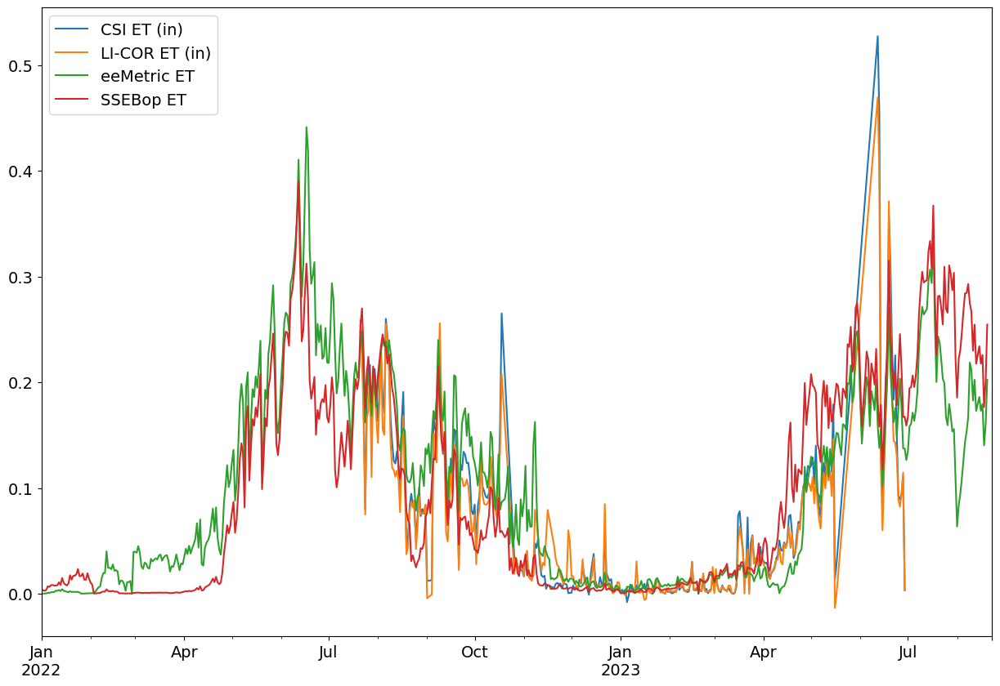

In [55]:
 et_compile[['CSI ET (in)','LI-COR ET (in)','eeMetric ET','SSEBop ET']].plot()

C:\Users\paulinkenbrandt\AppData\Local\Temp\1\ipykernel_3068\255276426.py:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('RdYlBu')
C:\Users\paulinkenbrandt\AppData\Local\Temp\1\ipykernel_3068\255276426.py:46: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(m)


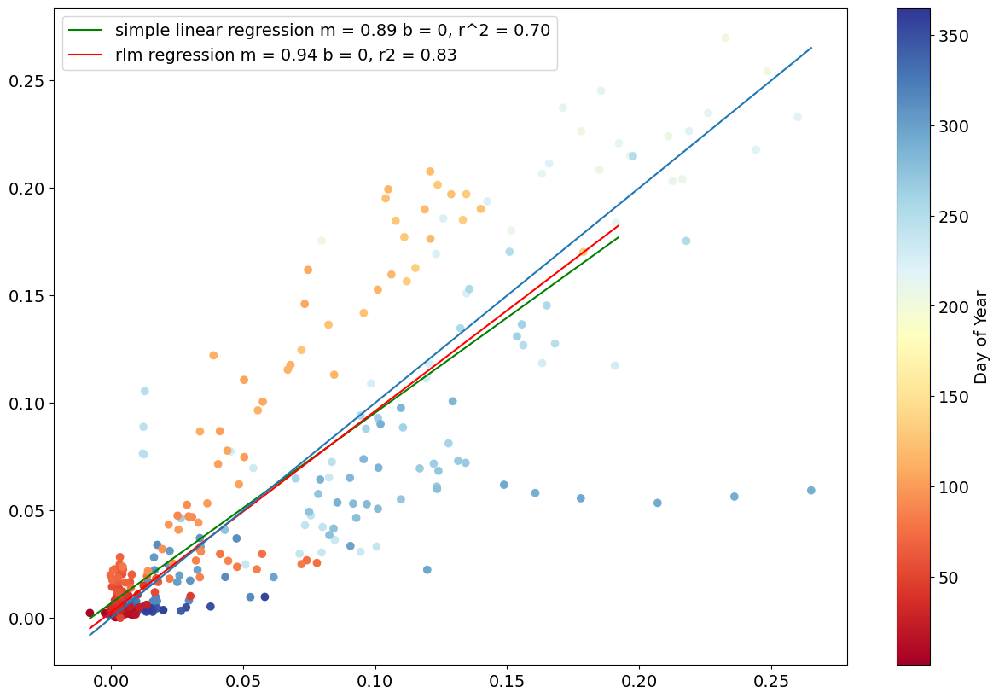

In [61]:
etnona = et_compile[['CSI ET (in)','SSEBop ET']].dropna()

x = etnona['CSI ET (in)']
y = etnona['SSEBop ET']
w = etnona.index.dayofyear

scatterColor(x,y,w)
lin = np.linspace(x.min(),x.max(),100)
plt.plot(lin,lin)
plt.legend()

C:\Users\paulinkenbrandt\AppData\Local\Temp\1\ipykernel_3068\255276426.py:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('RdYlBu')
C:\Users\paulinkenbrandt\AppData\Local\Temp\1\ipykernel_3068\255276426.py:46: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(m)


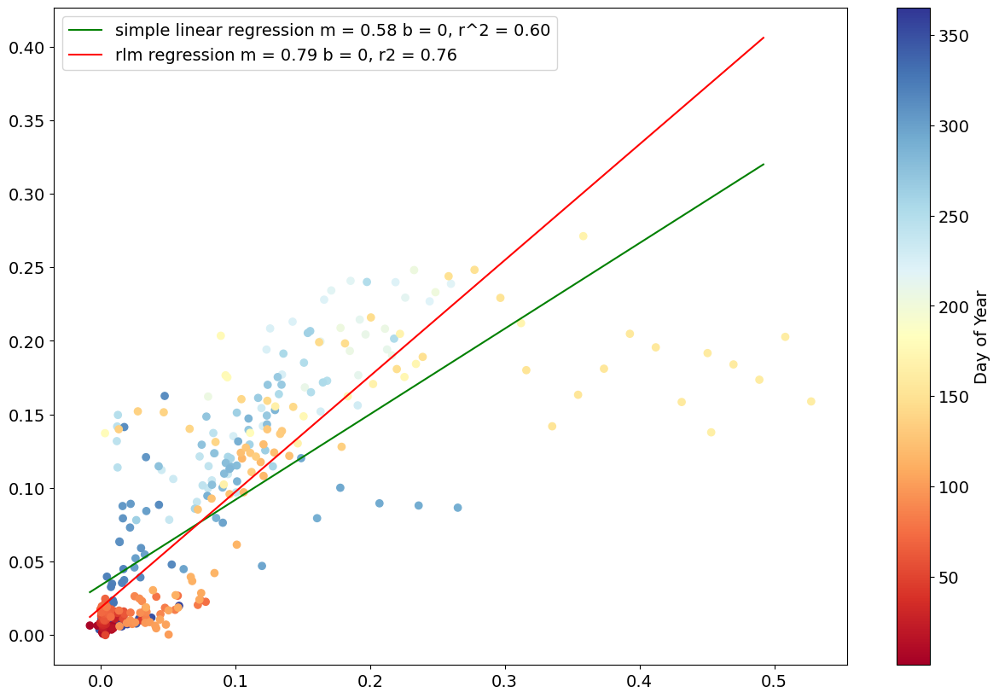

In [48]:
etnona = et_compile[['CSI ET (in)','eeMetric ET']].dropna()

x = etnona['CSI ET (in)']
y = etnona['eeMetric ET']
w = etnona.index.dayofyear

scatterColor(x,y,w)
plt.legend()

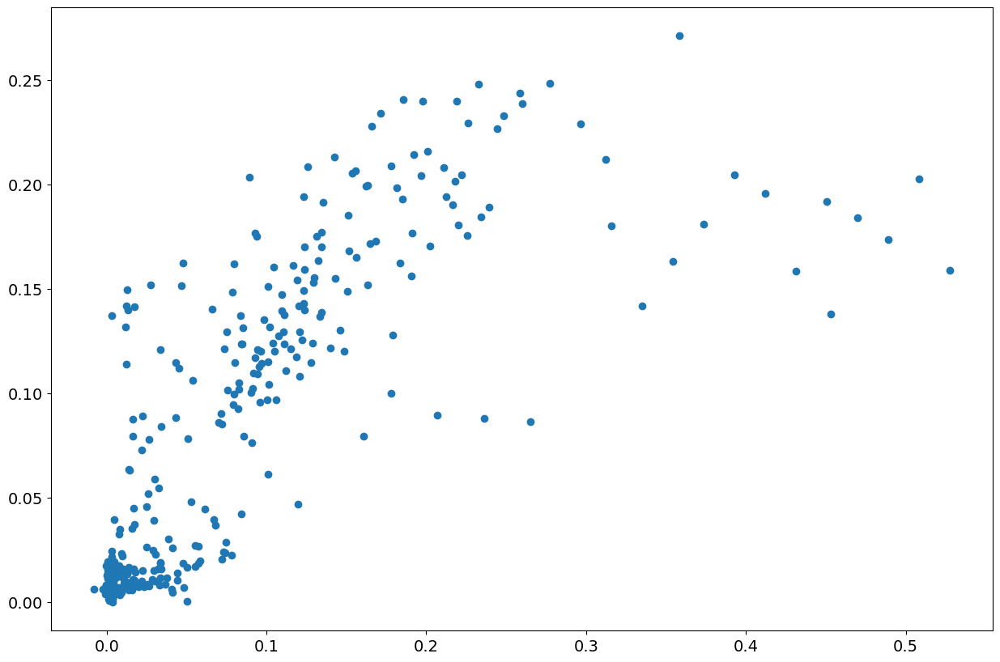

In [44]:
plt.scatter(et_compile['CSI ET (in)'],et_compile['eeMetric ET'])

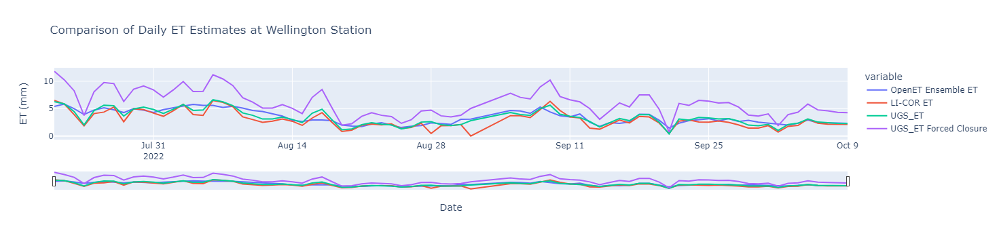

In [9]:
openet_data = pd.read_csv(comp_dir / "openet_et_2022.csv",parse_dates=True,index_col='DateTime')

openet_data = openet_data.drop(['ET Units', 'Source', 'Method'],axis=1)

licor = pd.read_excel(comp_dir / "Wellington ET data LICOR.xlsx", index_col="Date/Time",skiprows=[1],parse_dates=True)
licor.index = pd.to_datetime(licor.index,format='ISO8601') 
licor_dly = licor.groupby(pd.Grouper(freq='1D')).sum()
licor_dly = licor_dly.replace(0,np.nan)

ugs_et = pd.read_csv(comp_dir / "CS_output_OpenetQAQC_postprocess.csv", index_col="date", parse_dates=True)
ugs_et = ugs_et.rename(columns={'ET':'UGS_ET','ET_corr':'UGS_ET Forced Closure'})

et_data = pd.concat([openet_data,licor_dly,ugs_et[['UGS_ET','UGS_ET Forced Closure']]],axis=1).sort_index()
et_data = et_data.rename(columns = {'Ensemble ET':'OpenET Ensemble ET'})

sbst = et_data.dropna(subset=['OpenET Ensemble ET','UGS_ET','LI-COR ET'])

fig = px.line(sbst, y=["OpenET Ensemble ET","LI-COR ET","UGS_ET","UGS_ET Forced Closure"],
              title="Comparison of Daily ET Estimates at Wellington Station",
              labels={
                     "value": "ET (mm)",
                     "index": "Date"})

fig.layout.height = 500

fig.update_xaxes(rangeslider_visible=True)

fig.show()

In [22]:
licor_ugs = pd.read_excel(xl_comp, sheet_name='ET',index_col='Datetime',parse_dates=True)


licor_ugs.columns

Index(['LI-COR LE (W m-2)', 'ET Sensor (mm)', 'LI-COR ET (in)',
       'LI-COR ET cuml (mm)', 'LI-COR 24H ET (mm)', 'LI-COR 24H ET (in)',
       'CSI LE (W m-2)', 'CSI EC System (mm)', 'CSI ET (in)',
       'CSI ET cuml (mm)', 'CSI 24H ET (mm)', 'CSI 24H ET (in)',
       'CSI SWC_1_1_1 (%)'],
      dtype='object')

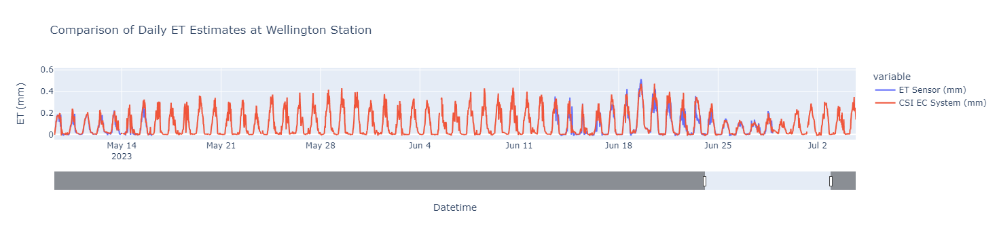

In [23]:
fig = px.line(licor_ugs, y=['ET Sensor (mm)','CSI EC System (mm)'],
              title="Comparison of Daily ET Estimates at Wellington Station",
              labels={
                     "value": "ET (mm)",
                     "index": "Date"})

fig.layout.height = 500

fig.update_xaxes(rangeslider_visible=True)

fig.show()

In [25]:
compare = licor_ugs[['ET Sensor (mm)','CSI EC System (mm)']].dropna()

w = sbst.index.dayofyear

scatterColor(x0,y,w)
plt.grid()

plt.plot(range(0,8),range(0,8),linestyle=':',color='grey',label="1:1 line")
plt.xlabel('UGS ET (mm/day)')
plt.ylabel('OpenET Ensemble ET (mm/day)')
plt.xlim(0,7)
plt.ylim(0,7)
plt.legend()

,ET Sensor (mm),CSI EC System (mm)
Datetime,,
2022-07-21 00:00:00,-0.006332,0.014046
2022-07-21 00:30:00,0.008682,0.014046
2022-07-21 01:00:00,-0.001172,0.014046
2022-07-21 01:30:00,0.003261,0.002468
2022-07-21 02:00:00,-0.004427,0.001227
...,...,...
2023-06-28 20:30:00.055000,0.019331,0.024881
2023-06-28 21:00:00.060000,0.043998,0.039399
2023-06-28 21:30:00.065000,0.042946,0.038355


In [17]:
openet_data = pd.read_csv(comp_dir / "openet_et_2022.csv",parse_dates=True,index_col='DateTime')
openet_data = openet_data.drop(['ET Units', 'Source', 'Method'],axis=1)

licor = pd.read_excel(comp_dir / "Wellington ET data LICOR.xlsx", index_col="Date/Time",skiprows=[1],parse_dates=True)
licor_dly = licor.groupby(pd.Grouper(freq='1D')).sum()
licor_dly = licor_dly.replace(0,np.nan)

ugs_et = pd.read_csv(comp_dir / "CS_output_OpenetQAQC_postprocess.csv", index_col="date", parse_dates=True)
ugs_et = ugs_et.rename(columns={'ET':'UGS_ET','ET_corr':'UGS_ET Forced Closure'})

et_data = pd.concat([openet_data,licor_dly,ugs_et[['UGS_ET','UGS_ET Forced Closure']]],axis=1).sort_index()
et_data = et_data.rename(columns = {'Ensemble ET':'OpenET Ensemble ET'})

sbst = et_data.dropna(subset=['OpenET Ensemble ET','UGS_ET','eeMetric ET'])

fig = px.line(sbst, y=["OpenET Ensemble ET","eeMetric ET","UGS_ET","UGS_ET Forced Closure"],
              title="Comparison of Daily ET Estimates at Wellington Station",
              labels={
                     "value": "ET (mm)",
                     "index": "Date"})



fig.update_xaxes(rangeslider_visible=True)

fig.show()

TypeError: Only valid with DatetimeIndex, TimedeltaIndex or PeriodIndex, but got an instance of 'Index'

,Datetime,LI-COR LE (W m-2),ET Sensor (mm),LI-COR ET (in),LI-COR ET cuml (mm),LI-COR 24H ET (mm),LI-COR 24H ET (in),CSI LE (W m-2),CSI EC System (mm),CSI ET (in),CSI ET cuml (mm),CSI 24H ET (mm),CSI 24H ET (in),CSI SWC_1_1_1 (%)
0,2022-07-21 00:00:00.000,-8.622538,-0.006332,-0.000249,-0.006332,NaN,NaN,19.1252,0.014046,0.000553,0.014046,NaN,NaN,27.64217
1,2022-07-21 00:30:00.000,11.821415,0.008682,0.000342,0.002349,NaN,NaN,19.1252,0.014046,0.000553,0.014046,NaN,NaN,27.64217
2,2022-07-21 01:00:00.000,-1.595349,-0.001172,-0.000046,0.001178,NaN,NaN,19.1252,0.014046,0.000553,0.014046,NaN,NaN,27.64217
3,2022-07-21 01:30:00.000,4.440975,0.003261,0.000128,0.004439,NaN,NaN,3.361051,0.002468,0.000097,0.016514,NaN,NaN,27.55636
4,2022-07-21 02:00:00.000,-6.028048,-0.004427,-0.000174,0.000012,NaN,NaN,1.670975,0.001227,0.000048,0.017741,NaN,NaN,27.47233
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17279,2023-07-15 22:30:04.155,NaN,NaN,NaN,NaN,NaN,NaN,32.73773,0.024043,0.000947,717.861522,NaN,NaN,44.67131
17280,2023-07-15 23:00:04.160,NaN,NaN,NaN,NaN,NaN,NaN,7.190697,0.005281,0.000208,717.866803,NaN,NaN,44.57008
17281,2023-07-15 23:30:04.165,NaN,NaN,NaN,NaN,NaN,NaN,19.50628,0.014325,0.000564,717.881128,NaN,NaN,44.49763
17282,NaT,NaN,NaN,NaN,NaN,NaN,NaN,12.70925,0.009334,0.000367,717.890462,NaN,NaN,44.37853


Index([       '2022-07-21 00:00:00',        '2022-07-21 00:30:00',
              '2022-07-21 01:00:00',        '2022-07-21 01:30:00',
              '2022-07-21 02:00:00',        '2022-07-21 02:30:00',
              '2022-07-21 03:00:00',        '2022-07-21 03:30:00',
              '2022-07-21 04:00:00',        '2022-07-21 04:30:00',
       ...
       '2023-07-15 20:00:04.130000', '2023-07-15 20:30:04.135000',
       '2023-07-15 21:00:04.140000', '2023-07-15 21:30:04.145000',
       '2023-07-15 22:00:04.150000', '2023-07-15 22:30:04.155000',
       '2023-07-15 23:00:04.160000', '2023-07-15 23:30:04.165000',
                                nan,                          nan],
      dtype='object', name='Datetime', length=17284)

AttributeError: 'Index' object has no attribute 'dayofyear'

C:\Users\paulinkenbrandt\AppData\Local\Temp\1\ipykernel_21408\255276426.py:46: MatplotlibDeprecationWarning:

Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.



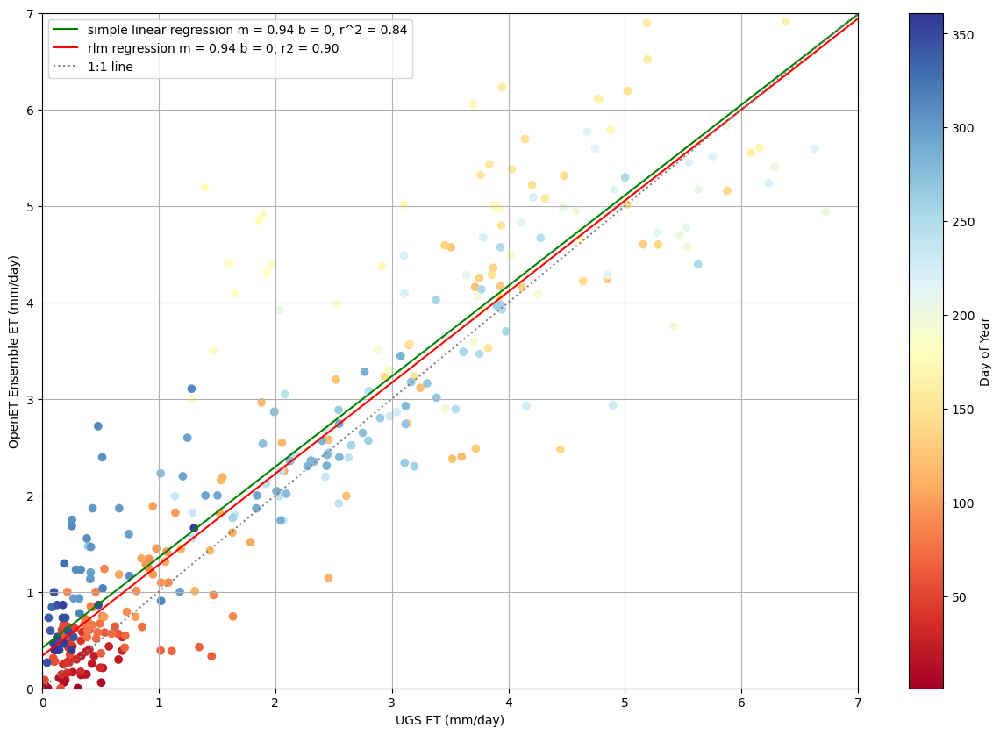

In [12]:
x0 = sbst['UGS_ET']
y = sbst['OpenET Ensemble ET']
w = sbst.index.dayofyear

scatterColor(x0,y,w)
plt.grid()

plt.plot(range(0,8),range(0,8),linestyle=':',color='grey',label="1:1 line")
plt.xlabel('UGS ET (mm/day)')
plt.ylabel('OpenET Ensemble ET (mm/day)')
plt.xlim(0,7)
plt.ylim(0,7)
plt.legend()

C:\Users\paulinkenbrandt\AppData\Local\Temp\1\ipykernel_21408\255276426.py:46: MatplotlibDeprecationWarning:

Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.



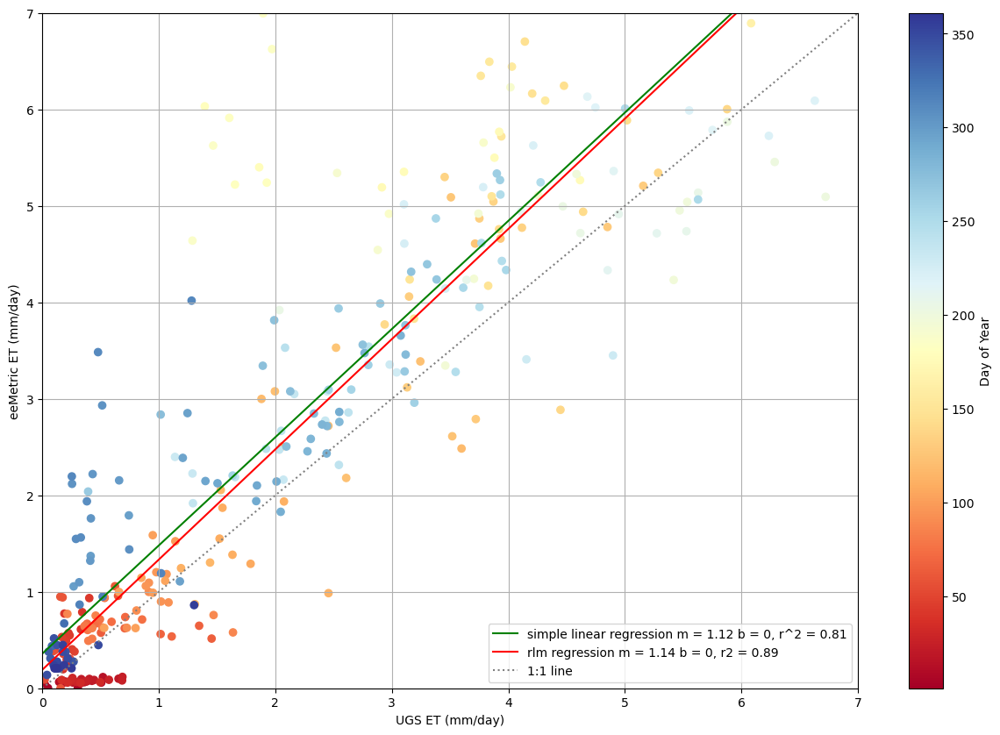

In [14]:
x0 = sbst['UGS_ET']
y = sbst["eeMetric ET"]
w = sbst.index.dayofyear

scatterColor(x0,y,w)
plt.grid()

plt.plot(range(0,8),range(0,8),linestyle=':',color='grey',label="1:1 line")
plt.xlabel('UGS ET (mm/day)')
plt.ylabel('eeMetric ET (mm/day)')
plt.xlim(0,7)
plt.ylim(0,7)
plt.legend()

C:\Users\paulinkenbrandt\AppData\Local\Temp\1\ipykernel_21408\255276426.py:46: MatplotlibDeprecationWarning:

Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.



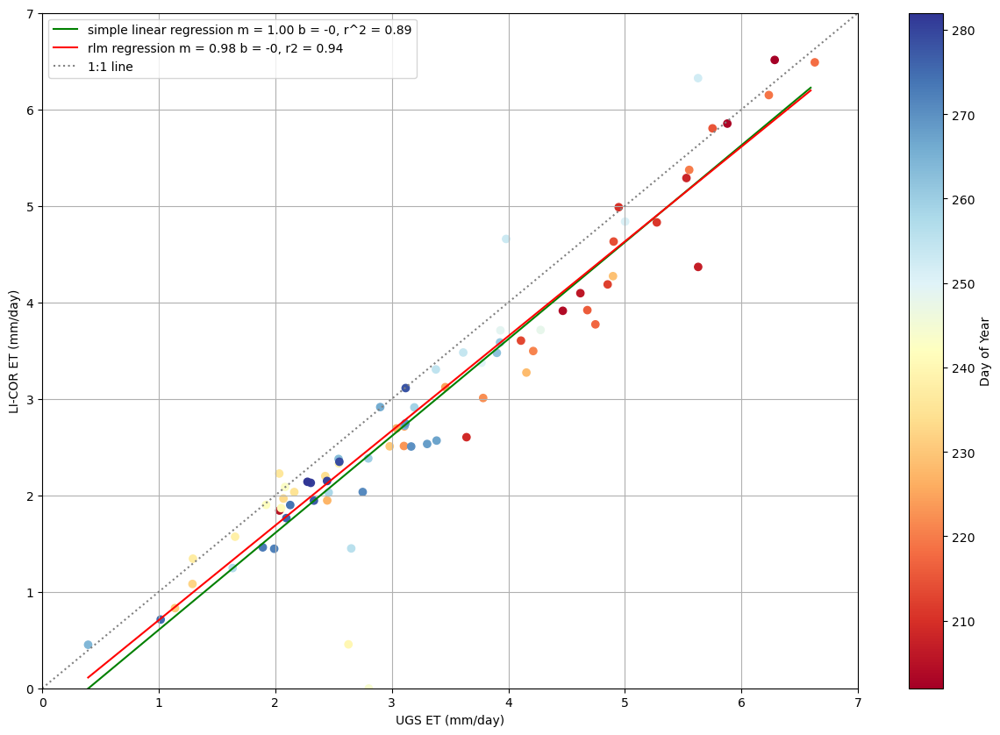

In [17]:
sbst = et_data.dropna(subset=['UGS_ET','LI-COR ET'])

x0 = sbst['UGS_ET']
y = sbst['LI-COR ET']
w = sbst.index.dayofyear

scatterColor(x0,y,w)
plt.grid()

plt.plot(range(0,8),range(0,8),linestyle=':',color='grey',label="1:1 line")
plt.xlabel('UGS ET (mm/day)')
plt.ylabel('LI-COR ET (mm/day)')
plt.xlim(0,7)
plt.ylim(0,7)
plt.legend()